## Visualization of SCODA Results

MLBI-Lab@DKU, Aug. 01, 2023

In [1]:
import os, copy, warnings
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
from scoda.viz import get_population, plot_population, plot_population_grouped
from scoda.viz import plot_sankey_e, plot_pct_box, get_gsea_summary, plot_gsea_all
from scoda.viz import plot_cci_dot, plot_cci_circ, plot_cci_circ_m
from scoda.viz import cci_remove_common, cci_get_ni_mat, cci_get_df_to_plot
from scoda.viz import plot_cnv, plot_marker_exp, plot_deg, plot_gsea_res, plot_td_stats
from scoda.deg import get_markers_from_deg

https://github.com/combio-dku


In [6]:
file_h5ad, species = 'BRCA_minsoo_v03.h5ad', 'human'
file_h5ad, species = 'BRCA_minsoo_for_test.h5ad', 'human'
file_h5ad, species = 'brca_8k_csv.h5ad', 'human'

adata_t = anndata.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'tumor_dec', 'tumor_score', 'celltype_minor_rev', 'cnv_cluster'
    var: 'gene'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

In [36]:
sample_col = 'sample'
cond_col = 'condition'

warnings.filterwarnings('ignore') 

## celltype annotation
### UMAP

In [8]:
adata = adata_t[:,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes = 2000) # , flavor = 'seurat_v3')

## PCA
N_pca = 15
sc.tl.pca(adata, svd_solver='arpack', n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca)
sc.tl.leiden(adata, resolution = 1)

sc.tl.umap(adata) 

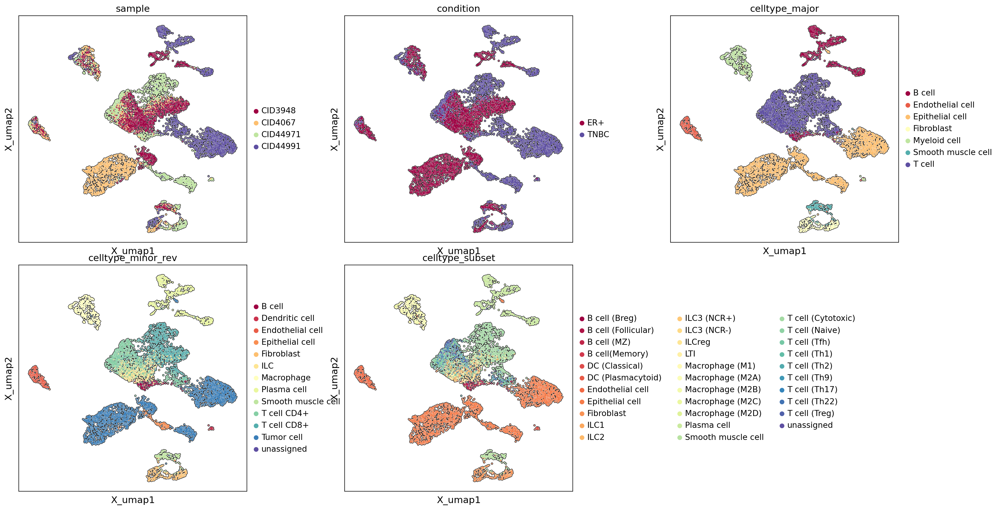

In [9]:
items_to_plot = ['sample', 'condition', 'celltype_major', 'celltype_minor_rev', 'celltype_subset'] 

ws_hs = (0.3, 0.1)
# adata.obsm['X_umap'] = adata.obsm['X_org_umap']
sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 12, 
                       ncols = 3, palette = 'Spectral', return_fig = True, add_outline = True) 

plt.show()

### Cell Population

In [10]:
celltype_col = 'celltype_minor_rev'
if celltype_col not in list(adata_t.obs.columns.values):
    celltype_col = 'celltype_minor_rev'

df_cnt, df_pct= get_population( adata_t.obs['sample'], 
                                adata_t.obs[celltype_col], sort_by = [] )
df_cnt

,B cell,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,Plasma cell,Smooth muscle cell,T cell CD4+,T cell CD8+,Tumor cell,unassigned
CID3948,4,3,71,2,4,433,96,200,62,451,448,226,0
CID4067,3,2,99,2,61,172,150,0,59,77,150,1225,0
CID44971,102,17,47,150,133,16,145,12,59,540,537,242,0
CID44991,20,2,14,5,69,1,59,442,14,153,103,1117,1


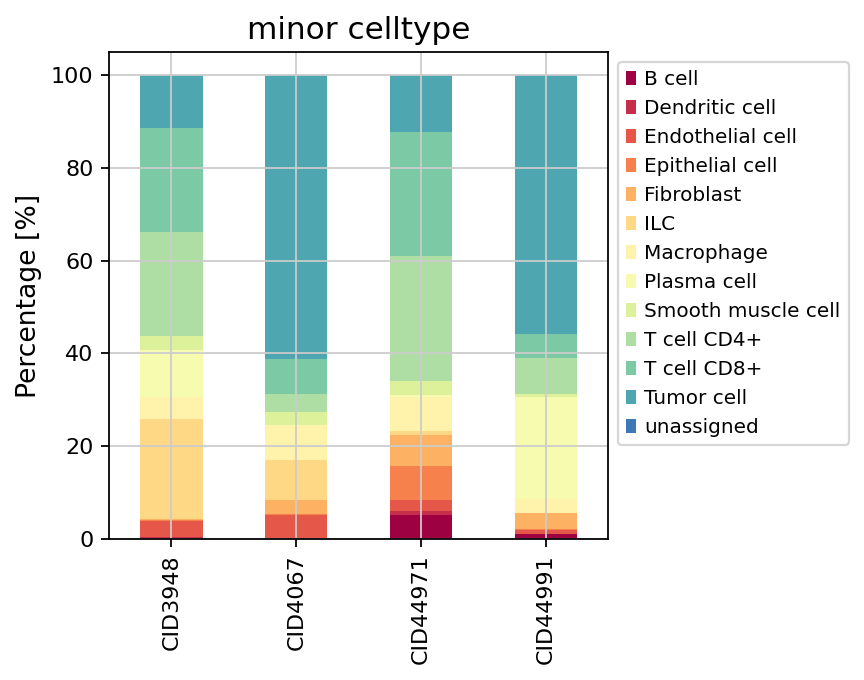

In [11]:
plot_population( df_pct, title = 'minor celltype', title_fs = 14, 
                 label_fs = 12, tick_fs = 10, tick_rot = 90,
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                 legend_ncol = 1, cmap_name = None, figsize=(4, 4), return_fig = False)

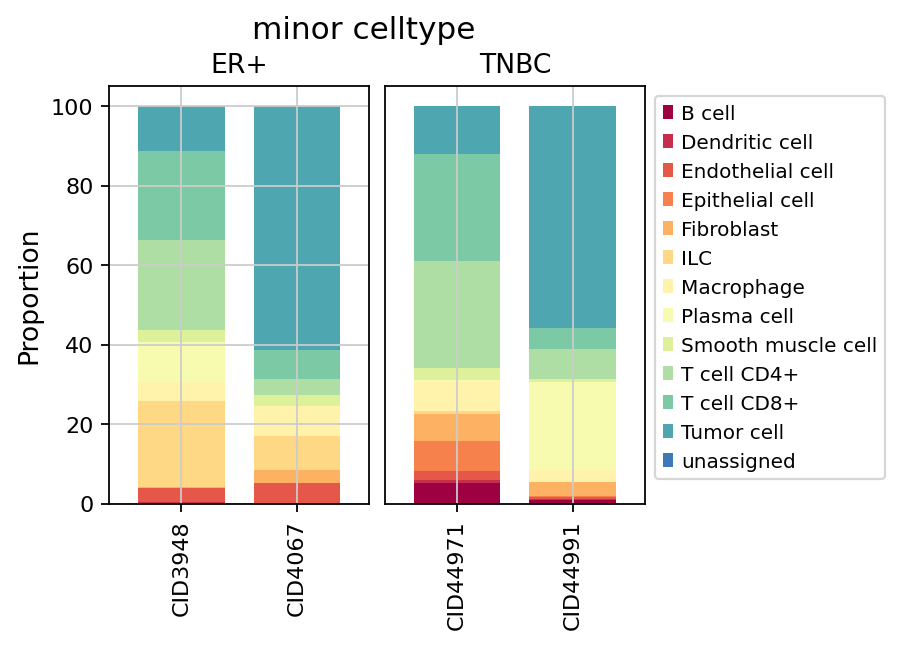

In [12]:
sg_map = {}
slst = list(df_cnt.index.values)
for s in slst:
    b = adata_t.obs['sample'] == s
    g = list(adata_t.obs.loc[b, 'condition'])[0]
    sg_map[s] = g
    
plot_population_grouped( df_pct, sg_map, sort_by = ['Tumor cell'], 
                         title = 'minor celltype', title_fs = 14, title_y = 1.1,
                         label_fs = 12, tick_fs = 10, tick_rot = 90,
                         legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                         legend_ncol = 1, cmap_name = None, figsize=(4, 3), return_fig = False)

In [13]:
## Tumor identification: UMAP, CNV heatmap, tumor markers, dotplot
lst = [adata_t.obs['celltype_minor'], adata_t.obs['celltype_major'], 
       adata_t.obs['tumor_dec'], adata_t.obs['celltype_minor_rev']]
plot_sankey_e( lst, title = None, fs = 13, WH = (800, 500), th = 10, title_y = 0.8 )
plt.show()

### Marker expression pattern

Num markers selected: 118 -> 118


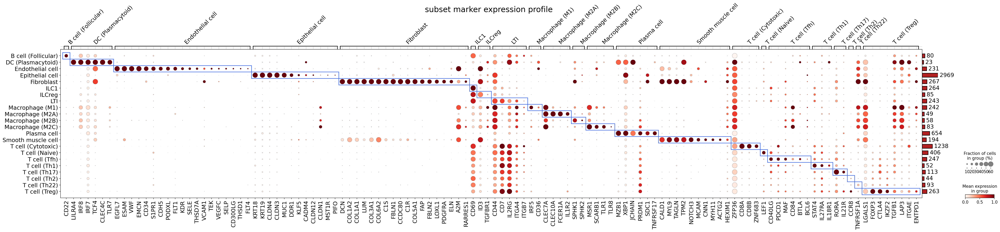

In [14]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )
target_lst = list(adata_t.obs['celltype_subset'].unique())

title = 'subset marker expression profile  \n \n  \n \n '

pes, pexs, md = plot_marker_exp( adata_t, target_lst, 'celltype_subset', mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = None, other_genes = [], show_unassigned = False, 
                          add_rect = True, standard_scale = 'var', figsize = None )


### CNV & tumor cell identification

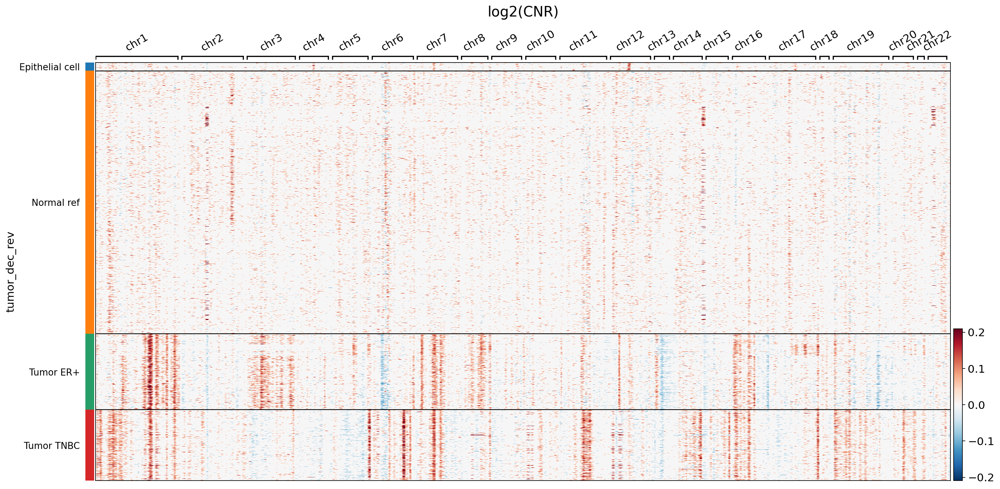

In [15]:
adata = adata_t[:,:]

cond_col = 'condition'
clst = adata.obs[cond_col].unique()
adata.obs['tumor_dec_rev'] = adata.obs['celltype_major'].copy(deep = True).astype(str)
b = adata.obs['tumor_dec_rev'].isin(adata.uns['cnv_ref_celltypes'])
adata.obs.loc[b, 'tumor_dec_rev'] = 'Normal ref'
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['tumor_dec'] == 'Tumor')
    s = 'Tumor %s' % c
    adata.obs.loc[b, 'tumor_dec_rev'] = s

plot_cnv( adata, groupby = 'tumor_dec_rev', title_fs = 18, label_fs = 12,
          figsize = (20, 10), swap_axes = False, 
          var_group_rotation = 30, cmap='RdBu_r', vmax = 1)

### CNV UMAP

In [16]:
adata = adata_t[:,:]

N_pca = 15
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca, 
                use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')

ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)    
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

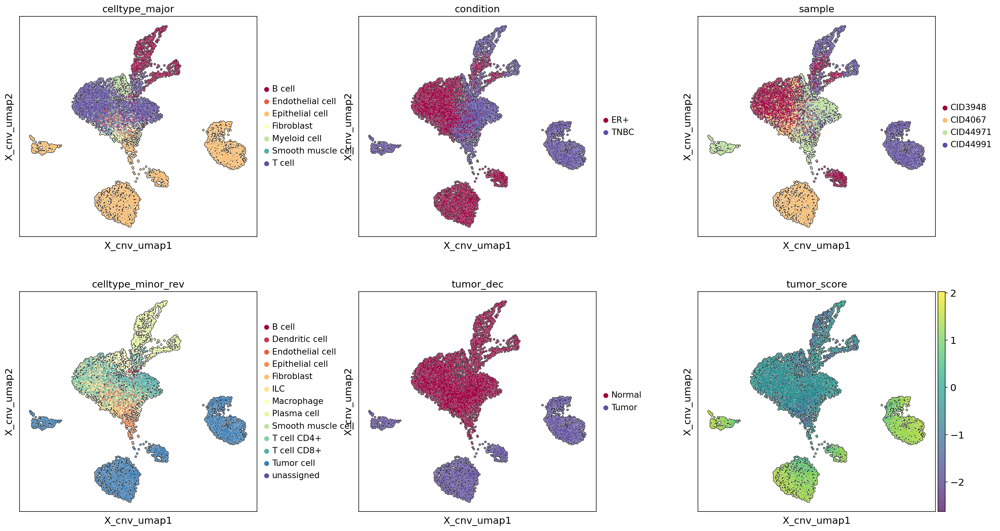

In [17]:
items_to_plot = ['celltype_major', 'condition', 'sample', 'celltype_minor_rev', 'tumor_dec', 'tumor_score'] 

sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.3, legend_fontsize = 12, ncols = 3, 
                       palette = 'Spectral', return_fig = False, add_outline = True) 
plt.show()

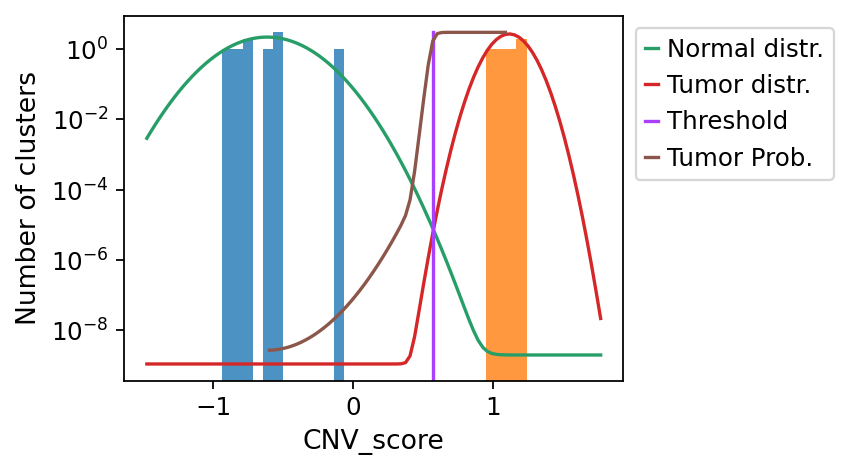

In [18]:
td_params = adata_t.uns['cnv_addon_summary']['tumor_dec_params']

plot_td_stats( td_params, n_bins = 30, title = None, title_fs = 14,
                label_fs = 12, tick_fs = 11, legend_fs = 11, 
                legend_loc = 'upper left', bbox_to_anchor = (1, 1),
                figsize = (4,3), log = True, alpha = 0.8 )

<AxesSubplot: >

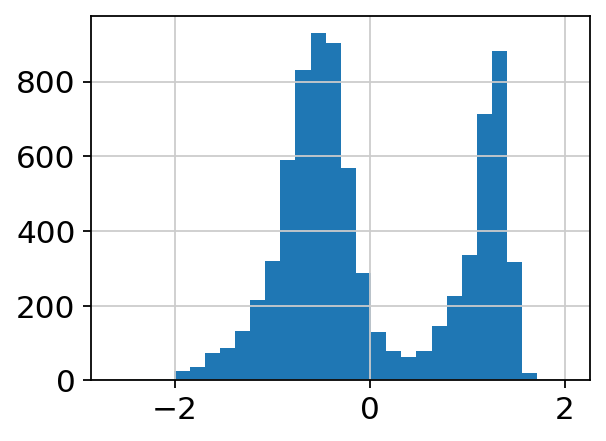

In [19]:
plt.figure(figsize = (4,3))
adata_t.obs['tumor_score'].hist(bins = 30)

### cell-cell interaction

In [20]:
df_dct = adata_t.uns['CCI']
cond_lst = list(df_dct.keys())
cond_lst

['ER+', 'TNBC']

In [21]:
dfs_dct = cci_remove_common( df_dct )
df_lst = cci_get_ni_mat( df_dct )

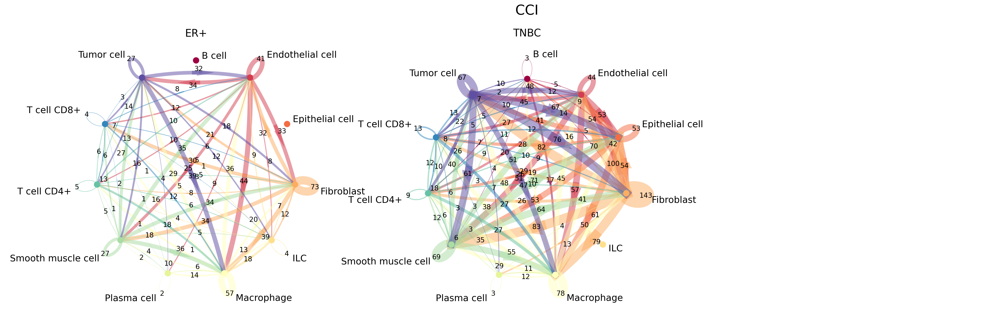

In [22]:
plot_cci_circ_m( df_lst, ncol = 3, figsize = (8,7), title = 'CCI', title_y = 1.1, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.2, 0.1) )

In [23]:
idx_dct = {}
for g in df_dct.keys():
    idx_dct[g] = list(df_dct[g].index.values)

idx1 = idx_dct['ER+']
idx2 = idx_dct['TNBC']
idxc = list(set(idx1).intersection(idx2))

len(idxc), len(idx1), len(idx2)

(767, 1208, 2889)

'Union of Interactions: 783'

21 cell_pairs, 331 gene_pairs found


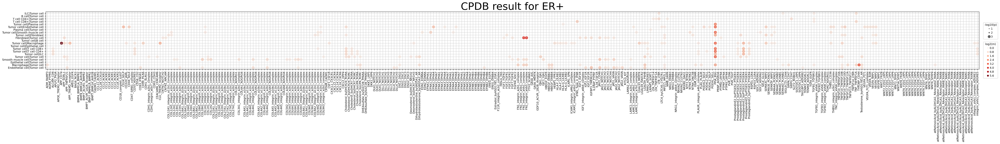

21 cell_pairs, 331 gene_pairs found


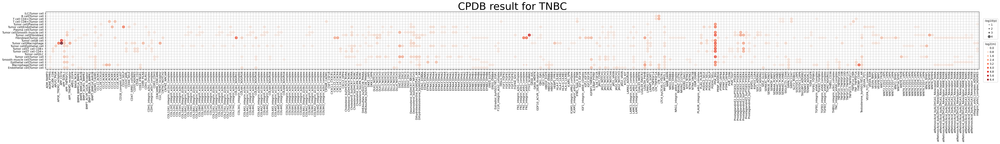

In [24]:
df_dct_to_plot = cci_get_df_to_plot( df_dct, target_cells = ['Tumor cell'], 
                                     pval_cutoff = 0.01, mean_cutoff = 1 )

## CCI: circle plot, dotplot, pairwise venn diagram
for g in df_dct_to_plot.keys():
    
    dfv = df_dct_to_plot[g]
    idxs = list(dfv.index.values)
    
    dfs = dfv.sort_values(by = ['gene_pair', 'cell_pair'])
    
    ax = plot_cci_dot( dfs, mkr_sz = 9, tick_sz = 9, 
                       legend_fs = 9, title_fs = 34, dpi = 120,
                       title = 'CPDB result for %s' % g, swap_ax = True )

### DEG

In [25]:
nc_deg_dct = adata_t.uns['DEG_stat']
df_deg_dct = adata_t.uns['DEG']
df_deg_dct.keys()

dict_keys(['Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+', 'Tumor cell'])

In [26]:
target = 'Tumor cell'

df_deg = df_deg_dct[target]
nc_deg = nc_deg_dct[target]

nc_deg

{'ER+_vs_others': {'ER+': 678, 'others': 694},
 'TNBC_vs_others': {'TNBC': 694, 'others': 678}}

In [27]:
df_deg['TNBC_vs_others']

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,Rp
MARCKS,5.201000,1.527831e-146,1.706740e-142,0.916999,0.040015,0.719020,0.047198,0.652750,0.719
LMO4,4.859000,3.218403e-122,3.595278e-118,0.968348,0.054781,0.691643,0.048673,0.625953,0.692
CD82,3.936000,3.486748e-129,3.895046e-125,0.957352,0.099703,0.749280,0.115044,0.586796,0.749
PHGDH,4.886000,8.425880e-102,9.412551e-98,0.677840,0.032265,0.621037,0.032448,0.581388,0.621
HIST1H4C,3.935000,3.273037e-103,3.656310e-99,1.255444,0.151923,0.768012,0.131268,0.579614,0.768
...,...,...,...,...,...,...,...,...,...
TPSB2,-29.020000,3.025850e-09,3.380177e-05,0.000000,0.053002,0.000000,0.051622,0.000000,0.000
CTA-392E5.1,-32.683998,9.054955e-57,1.011529e-52,0.000000,0.524641,0.000000,0.312684,0.000000,0.000
AZU1,-29.379000,4.058360e-12,4.533594e-08,0.000000,0.067496,0.000000,0.069322,0.000000,0.000
LINC01117,-29.121000,5.714997e-13,6.384223e-09,0.000000,0.056729,0.000000,0.075221,0.000000,0.000


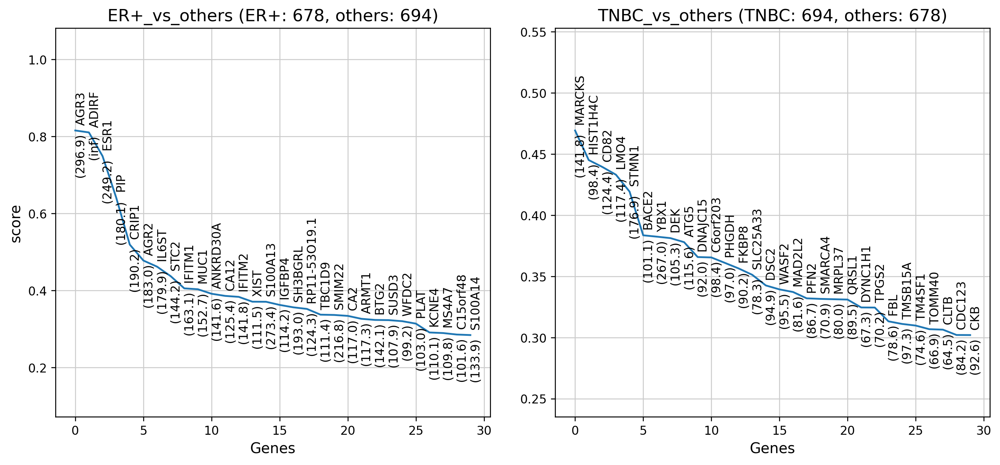

In [28]:
for k in df_deg.keys():
    df_deg[k]['score'] = df_deg[k]['nz_pct_score']*df_deg[k]['Rp']

plot_deg( df_deg, value = 'score', n_genes = 30, pval_cutoff = 0.05, 
          figsize = (6,5), text_fs = 10, title_fs = 14, label_fs = 12, 
          tick_fs = 10, ncol = 2, ws_hs = (0.15, 0.2), deg_stat_dct = nc_deg )
    

In [32]:
mkr_dict = get_markers_from_deg( df_deg, N_mkrs = 30, rem_common = True )

## Print results   
for key in mkr_dict.keys():
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])        

ER+ (30):  ['SMIM22', 'SUSD3', 'AGR2', 'STC2', 'AGR3', 'IFITM2', 'MS4A7', 'PIP', 'CRIP1', 'S100A14', 'XIST', 'ESR1', 'ADIRF', 'SH3BGRL', 'BTG2', 'TBC1D9', 'IFITM1', 'PLAT', 'CA2', 'IGFBP4', 'WFDC2', 'C15orf48', 'ANKRD30A', 'RP11-53O19.1', 'MUC1', 'KCNE4', 'ARMT1', 'CA12', 'IL6ST', 'S100A13']
TNBC (30):  ['ATG5', 'MRPL37', 'CLTB', 'MAD2L2', 'TPGS2', 'C6orf203', 'FKBP8', 'BACE2', 'QRSL1', 'LMO4', 'PFN2', 'YBX1', 'CKB', 'TM4SF1', 'FBL', 'CDC123', 'SLC25A33', 'TOMM40', 'STMN1', 'WASF2', 'DYNC1H1', 'PHGDH', 'DSC2', 'SMARCA4', 'TMSB15A', 'MARCKS', 'HIST1H4C', 'DNAJC15', 'CD82', 'DEK']


In [33]:
## Select cells
adata_s = adata_t[:,:]
target_cell = 'Epithelial cell'

b1 = adata_s.obs['celltype_major'] == target_cell
b2 = adata_s.obs['tumor_dec'] != 'unclear'
b = b1 # & b2

adata_s.obs.loc[b,'tumor_dec'] == 'Normal'

adata_s = adata_s[b,:]

In [37]:
## Assign new sample name with subtype prefix
subtype_field = 'cond_new'
adata_s.obs[subtype_field] = adata_s.obs[cond_col].copy(deep = True).astype(str)
b = adata_s.obs['tumor_dec'] == 'Normal'
adata_s.obs.loc[b, subtype_field] = 'Normal'

slst = list(adata_s.obs[sample_col])
clst = list(adata_s.obs[cond_col])
tlst = list(adata_s.obs[subtype_field])

plst2 = []
for s, c, t in zip(slst, clst, tlst):
    plst2.append('%s - %8s - %s' % (t, c, s))
        
pid_field = 'pid_e'
adata_s.obs[pid_field] = plst2

## Select samples with its No. of cells greater than 40
pcnt = adata_s.obs[pid_field].value_counts()
b = pcnt >= 200
plst = list(pcnt.index.values[b])

# display(pcnt[plst])
print('N_samples: ', len(plst), 'ave. N_cells: ', pcnt[plst].mean())

b = adata_s.obs[pid_field].isin(plst)
adata_ss = adata_s[b,:]

N_samples:  4 ave. N_cells:  702.5


Num markers selected: 60 -> 60


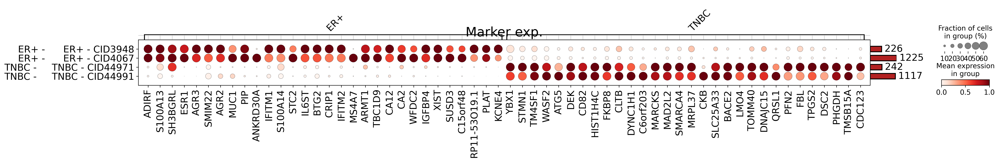

In [38]:
type_col = subtype_field 
target_lst = list(adata_ss.obs[subtype_field].unique())
target_lst.sort()
title = 'Marker exp.'

pes, pexs, md = plot_marker_exp( adata_ss, target_lst, type_col, mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', 
                          rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = 'pid_e', other_genes = [], show_unassigned = False, 
                          add_rect = False, standard_scale = 'var', figsize = None )
plt.show()

### plot GSEA results

In [50]:
gsea_res = adata_t.uns['GSEA']
gsea_res.keys()

dict_keys(['Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+', 'Tumor cell'])

In [51]:
df_qv, df_es = get_gsea_summary(gsea_res, max_log_p = 10)

,Macrophage: ER+_vs_others,Macrophage: TNBC_vs_others,Plasma cell: ER+_vs_others,Plasma cell: TNBC_vs_others,T cell CD4+: ER+_vs_others,T cell CD4+: TNBC_vs_others,T cell CD8+: ER+_vs_others,T cell CD8+: TNBC_vs_others,Tumor cell: ER+_vs_others,Tumor cell: TNBC_vs_others
Yersinia infection,1.274927,1.053078,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
Tryptophan metabolism,1.003831,1.130606,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
Toxoplasmosis,0.000000,0.000000,0.0,0.0,1.021189,0.0,20.0,20.0,0.0,0.0
Th17 cell differentiation,2.641474,2.339451,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
Th1 and Th2 cell differentiation,2.943495,2.461398,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


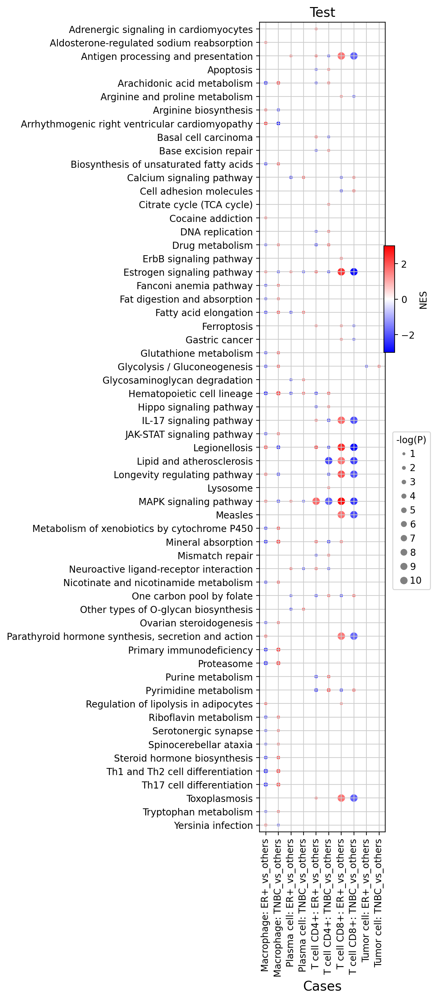

In [52]:
plot_gsea_all( df_qv, df_es, title = 'Test', title_fs = 14, 
               tick_fs = 10, tick_rot = 90, tick_ha = 'center',
               label_fs = 10, legend_fs = 10, swap_ax = False, fig_size_sf = 0.8 )